In [63]:
import os
from os import listdir, makedirs
from os.path import join, exists, expanduser

import random
from tqdm import tqdm
import numpy as np
import pandas as pd
import pickle
import datetime as dt

import itertools
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss, accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.linear_model import LogisticRegression

import cv2

from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import preprocess_input, decode_predictions

from keras.utils.np_utils import to_categorical # convert to one-hot-encoding


from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras.models import Sequential

from keras.optimizers import RMSprop
from keras import optimizers

from keras.callbacks import ReduceLROnPlateau
from mpl_toolkits.axes_grid1 import ImageGrid



from keras.applications.vgg16 import VGG16
from keras.applications.resnet50 import ResNet50
from keras.applications import xception
from keras.applications import inception_v3



from keras.applications.vgg16 import preprocess_input, decode_predictions

np.random.seed(2)
sns.set(style='white', context='notebook', palette='deep')

In [64]:
cache_dir = expanduser(join('~', '.keras'))
if not exists(cache_dir):
    makedirs(cache_dir)
models_dir = join(cache_dir, 'models')
if not exists(models_dir):
    makedirs(models_dir)

In [3]:
import keras
import numpy as np
from keras.applications import vgg16, inception_v3, resnet50, mobilenet
 
#Load the VGG model
vgg_model = vgg16.VGG16(weights='imagenet')
 
#Load the Inception_V3 model
inception_model = inception_v3.InceptionV3(weights='imagenet')
 
#Load the ResNet50 model
resnet_model = resnet50.ResNet50(weights='imagenet')
 
#Load the MobileNet model
mobilenet_model = mobilenet.MobileNet(weights='imagenet')

In [4]:
raw_labels = pd.read_csv("data/labels.csv")

In [65]:
labels_only = raw_labels['breed']

labels_set = set(labels_only)

num_labels = len(labels_set)


map_breed = {}


i=0;

for breed in labels_set:
    map_breed[breed] = i
    i+=1
    

label_map={}
for i in range(len(raw_labels['id'])):
    label_map[raw_labels['id'][i]] = map_breed[raw_labels['breed'][i]]
    

In [66]:
val_breed = {}
for item in map_breed:
    val_breed[map_breed[item]]=item
    

In [67]:
def show_data(path, IMG_SIZE, num):
    i=0
    for img in tqdm(os.listdir(path)):
        try:
#             img_array = cv2.imread(os.path.join(path,img),cv2.IMREAD_GRAYSCALE)
#             img_array = cv2.imread(os.path.join(path,img))
            img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_UNCHANGED)
            plt.imshow(img_array)
            plt.show()
            
            new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
            plt.imshow(new_array)
            plt.show()         
        except Exception as e: 
            pass
        if i>num:
            break
        i+=1


def read_prep_data(path, IMG_SIZE, label_map):
    data=[]
    for img in tqdm(os.listdir(path)):
        try:
#             img_array = cv2.imread(os.path.join(path,img) ,cv2.IMREAD_GRAYSCALE)
            img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_UNCHANGED)
            new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE)) 
            data.append([new_array, label_map[img[:-4]]])  
        except Exception as e: 
            pass
    return data
        
    
def select_categories(data, num_label):
    X=[]
    Y=[]
    
    random.shuffle(data)
    
    for features,label in training_data:
        if label in range(0, num_label):
            X.append(features)
            Y.append(label)
    return X, Y



In [68]:
def pickle_save(data, path):
    pickle_out = open(path,"wb")
    pickle.dump(data, pickle_out)
    pickle_out.close()
    
def pickle_load(path):
    pickle_in = open(path,"rb")
    return pickle.load(pickle_in)
    

In [69]:
def get_model(IMG_SIZE, num_label):
    model = Sequential()

    model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                     activation ='relu', input_shape = (IMG_SIZE,IMG_SIZE,1)))
    model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                     activation ='relu'))
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Dropout(0.25))


    model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', 
                     activation ='relu'))
    model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', 
                     activation ='relu'))
    model.add(MaxPool2D(pool_size=(2,2), strides=(2,2)))
    model.add(Dropout(0.25))


    model.add(Flatten())
    model.add(Dense(256, activation = "relu"))
    model.add(Dropout(0.5))
    model.add(Dense(num_label, activation = "softmax"))
    
    return model

In [70]:
def get_pred(data, model):
    preds = model.predict(data)
    return preds

def get_pred_models(data, models, model_names):
    preds_models = {}
    for i in range(len(models)):
        preds_models[model_names[i]] = get_pred(data, models[i])
    
    return preds_models
        
def show_pred(preds, Y, val_breed, index, seq, ran):
    leng = len(preds)
    if seq:
        for i in range(index):
            if ran:
                index = random.randint(0, leng) 
            _, imagenet_class_name, prob = decode_predictions(preds, top=1)[index][0]
            plt.title("Original: " + val_breed[Y[index]] + "\nPrediction: " + imagenet_class_name)
            plt.imshow(X_train[index])
            plt.show()
    else:
            _, imagenet_class_name, prob = decode_predictions(preds, top=1)[index][0]
            plt.title("Original: " + val_breed[Y[index]] + "\nPrediction: " + imagenet_class_name)
            plt.imshow(X_train[index])
            plt.show()
        
def accuracy_func(preds, Y, val_breed):
    leng = len(preds)
    count = 0;
    for i in range(leng):
        _, imagenet_class_name, prob = decode_predictions(preds, top=1)[i][0]
        if val_breed[Y[i]] == imagenet_class_name:
            count+=1
    accuracy = (count/leng)*100
    
    print("Accuracy: ", accuracy)
    return accuracy

In [71]:
def read_img(img_id, train_or_test, size):
    """Read and resize image.
    # Arguments
        img_id: string
        train_or_test: string 'train' or 'test'.
        size: resize the original image.
    # Returns
        Image as numpy array.
    """
    img = image.load_img(join(data_dir, train_or_test, '%s.jpg' % img_id), target_size=size)
    img = image.img_to_array(img)
    return img

In [72]:
training_path = "data/train"
testing_path = "data/test"
IMG_SIZE = 224
num=10

  0%|          | 0/10222 [00:00<?, ?it/s]

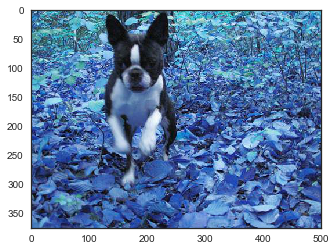

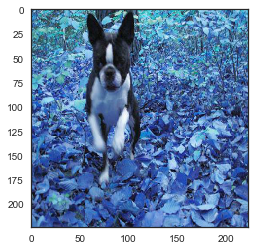

  0%|          | 1/10222 [00:01<3:15:39,  1.15s/it]

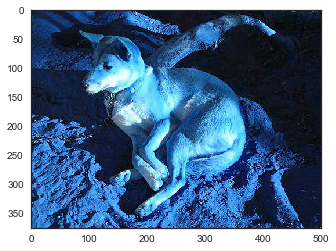

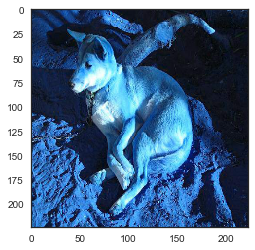

  0%|          | 2/10222 [00:01<2:09:57,  1.31it/s]

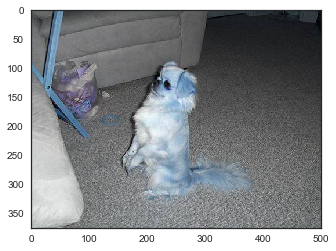

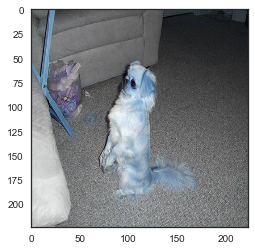

  0%|          | 3/10222 [00:01<1:47:50,  1.58it/s]

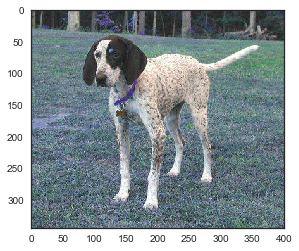

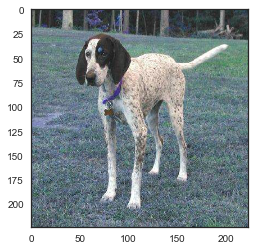

  0%|          | 4/10222 [00:02<1:37:38,  1.74it/s]

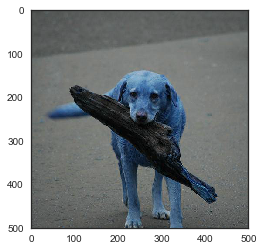

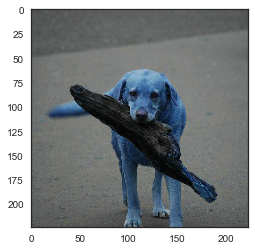

  0%|          | 5/10222 [00:02<1:33:17,  1.83it/s]

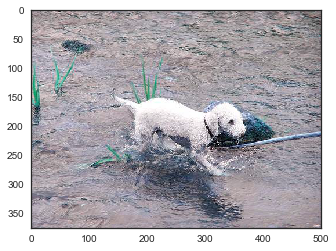

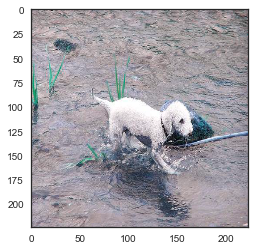

  0%|          | 6/10222 [00:03<1:36:14,  1.77it/s]

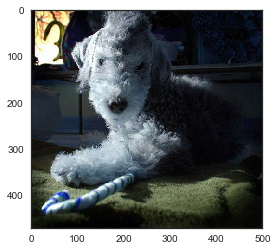

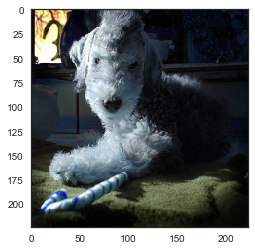

  0%|          | 7/10222 [00:04<1:38:42,  1.72it/s]

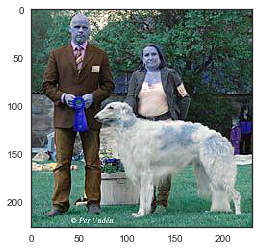

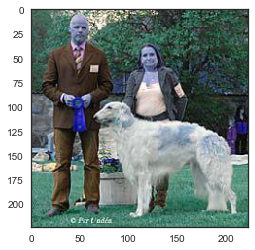

  0%|          | 8/10222 [00:04<1:34:17,  1.81it/s]

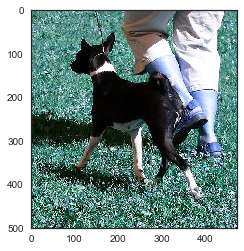

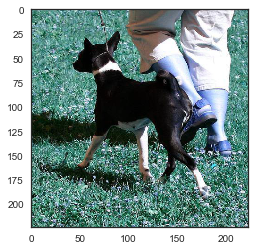

  0%|          | 9/10222 [00:04<1:30:04,  1.89it/s]

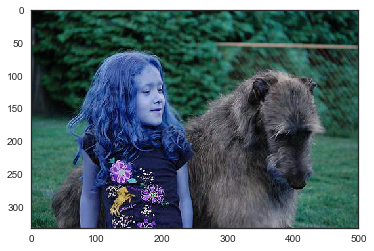

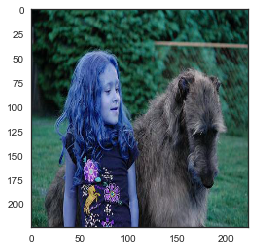

  0%|          | 10/10222 [00:05<1:27:26,  1.95it/s]

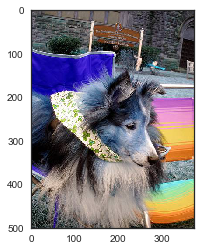

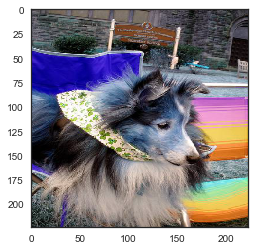

  0%|          | 11/10222 [00:05<1:26:21,  1.97it/s]

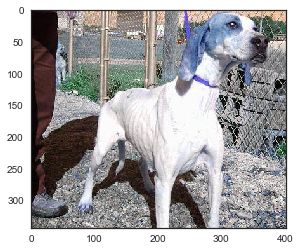

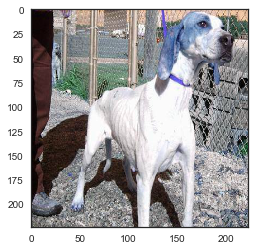


  0%|          | 0/10357 [00:00<?, ?it/s]

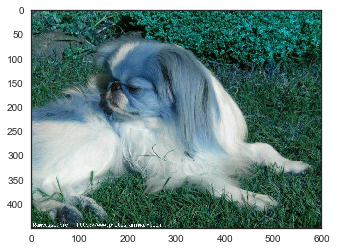

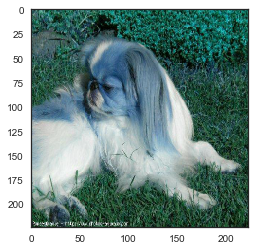

  0%|          | 1/10357 [00:00<1:13:04,  2.36it/s]

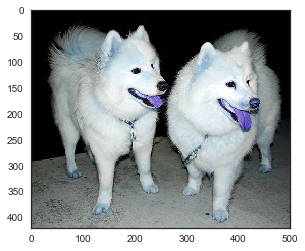

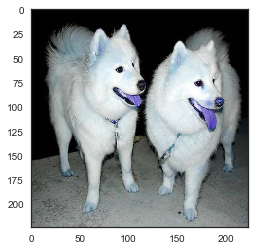

  0%|          | 2/10357 [00:00<1:15:46,  2.28it/s]

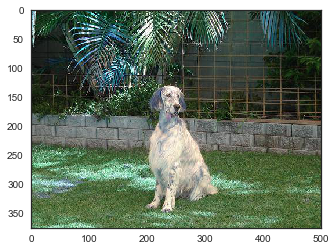

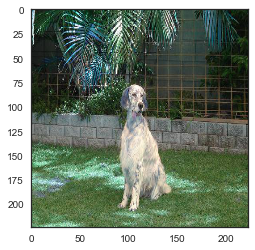

  0%|          | 3/10357 [00:01<1:12:25,  2.38it/s]

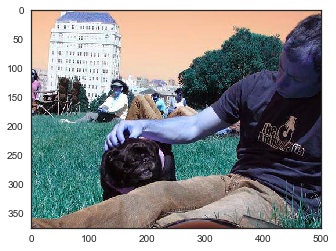

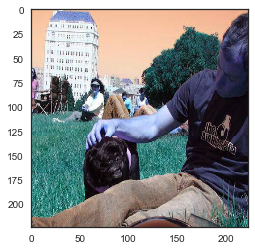

  0%|          | 4/10357 [00:01<1:07:04,  2.57it/s]

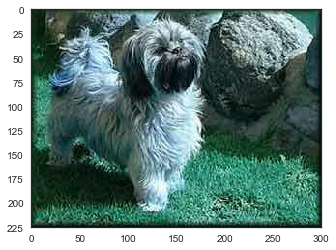

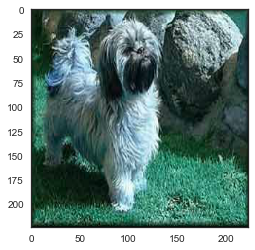

  0%|          | 5/10357 [00:01<1:06:24,  2.60it/s]

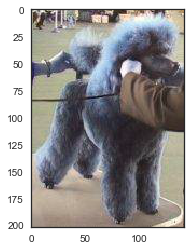

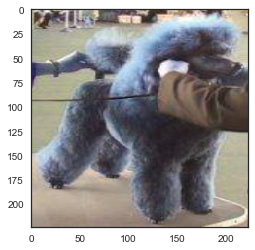

  0%|          | 6/10357 [00:02<1:09:32,  2.48it/s]

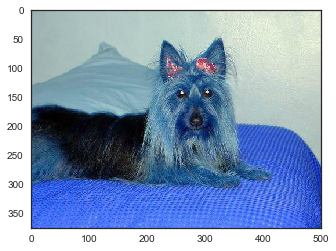

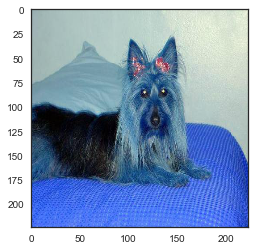

  0%|          | 7/10357 [00:02<1:07:30,  2.56it/s]

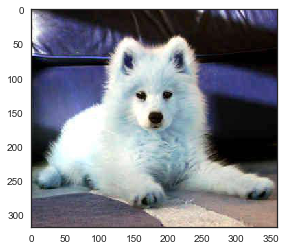

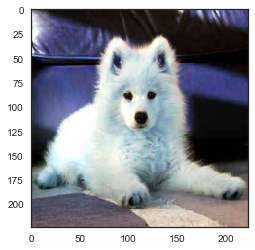

  0%|          | 8/10357 [00:03<1:12:08,  2.39it/s]

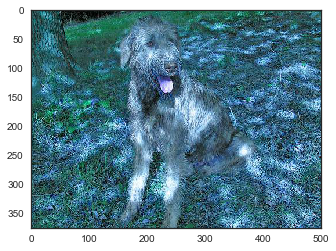

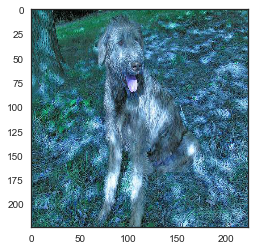

  0%|          | 9/10357 [00:03<1:10:24,  2.45it/s]

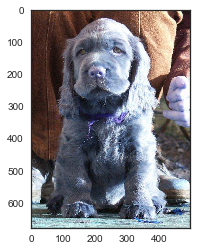

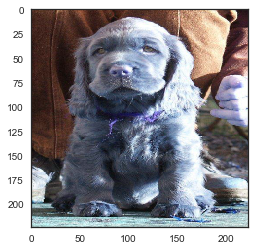

  0%|          | 10/10357 [00:04<1:09:11,  2.49it/s]

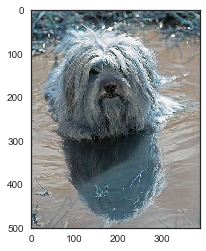

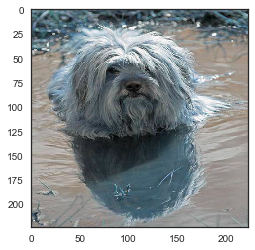

  0%|          | 11/10357 [00:04<1:08:52,  2.50it/s]

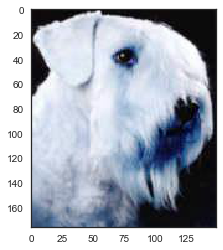

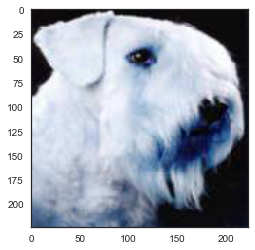

In [73]:
show_data(training_path, IMG_SIZE, num)

show_data(testing_path, IMG_SIZE, num)

In [14]:
training_data = read_prep_data(training_path, IMG_SIZE, label_map)
testing_data = read_prep_data(testing_path, IMG_SIZE, label_map)

print(len(training_data))
print(len(testing_data))

100%|██████████| 10357/10357 [01:59<00:00, 86.84it/s]


10222
0


In [23]:
training_data_file = "data/pickle/training_data"
testing_data_file = "data/pickle/testing_data"

In [24]:
# pickle_save(training_data, training_data_file)
# pickle_save(testing_data, testing_data_file)

In [25]:
# training_data = pickle_load(training_data_file)
# testing_data = pickle_load(testing_data_file)

In [74]:
num_label = num_labels
num_label = 2

In [98]:
X_train, Y_train = select_categories(training_data, num_label)
X_test, Y_test = select_categories(testing_data, num_label)
 
# print(set(Y_train))
print(len(Y_train))

# print(set(Y_test))
print(len(Y_test))

180
180


In [104]:
X_train = np.array(X_train).reshape(-1, IMG_SIZE, IMG_SIZE, 1)
X_test = np.array(X_test).reshape(-1, IMG_SIZE, IMG_SIZE, 1)

In [100]:
Y_train = to_categorical(Y_train, num_classes = num_label)
Y_test = to_categorical(Y_test, num_classes = num_label)

In [101]:
norm = 255.0
X_train, X_test = X_train/norm, X_test/norm

# Define the optimizer
# optimizer = RMSprop(lr=0.001, rho=0.9, epsilon=1e-08, decay=0.0)
optimizer = optimizers.Adam(lr=0.01, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)


model = get_model(IMG_SIZE, num_label)
# Compile the model
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])


# Set a learning rate annealer
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.001)


epochs = 100 # Turn epochs to 30 to get 0.9967 accuracy
batch_size = 32




In [102]:
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images


datagen.fit(X_train)

In [103]:
# Fit the model
history = model.fit_generator(datagen.flow(X_train,Y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (X_test,Y_test),
                              verbose = 2, steps_per_epoch=X_train.shape[0] // batch_size
                              , callbacks=[learning_rate_reduction])

ValueError: `x` (images tensor) and `y` (labels) should have the same length. Found: x.shape = (540, 224, 224, 1), y.shape = (180, 2)

In [30]:
start = dt.datetime.now()

In [32]:
preds = get_pred(X_train, vgg_model)

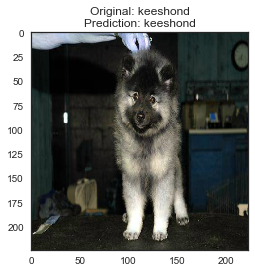

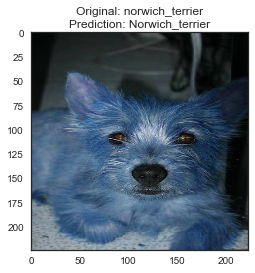

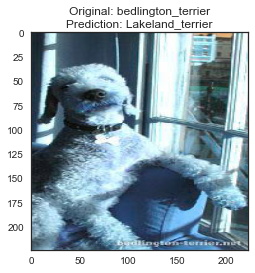

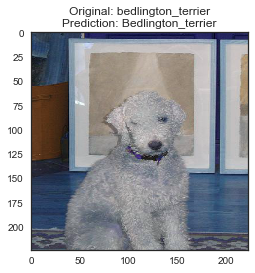

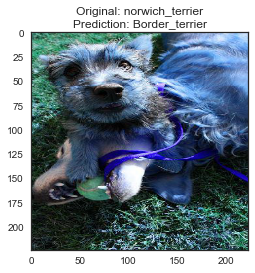

...

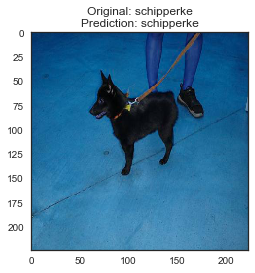

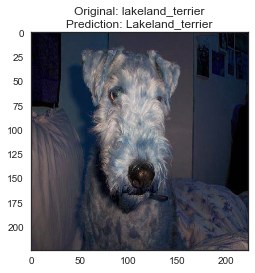

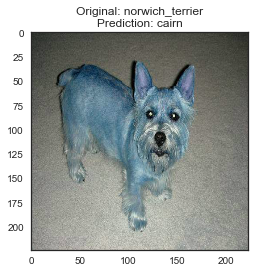

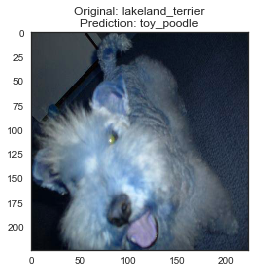

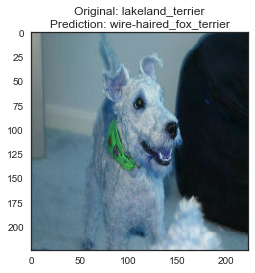

In [34]:
show_pred(preds, Y_train, val_breed, 50, True, True)

In [35]:
accuracy = accuracy_func(preds, Y_train, val_breed)

Accuracy:  29.099307159353348


In [47]:
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [58]:
from keras.applications.vgg16 import VGG16
from keras.utils.vis_utils import plot_model
model = VGG16()
plot_model(model, to_file='vgg.png')

ImportError: Failed to import `pydot`. Please install `pydot`. For example with `pip install pydot`.

In [ ]:
# Define the optimizer
# optimizer = RMSprop(lr=0.001, rho=0.9, epsilon=1e-08, decay=0.0)

model = vgg_model

optimizer = optimizers.Adam(lr=0.01, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
# Compile the model
model.add(Dense(10, activation='softmax'))
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])



# # Set a learning rate annealer
# learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
#                                             patience=3, 
#                                             verbose=1, 
#                                             factor=0.5, 
#                                             min_lr=0.001)

# epochs = 100 # Turn epochs to 30 to get 0.9967 accuracy
# batch_size = 32

In [ ]:
models = [vgg_model, inception_model, resnet_model, mobilenet_model]
models = [vgg_model]
model_names = ["Vgg", "Inception", "Resnet", "Mobilenet"]
model_names = ["Vgg"]

preds_models = get_pred_models(X_train, models, model_names)

In [59]:
from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense

# path to the model weights files.
weights_path = '../keras/models/vgg16_weights.h5'
top_model_weights_path = 'data/fc_model.h5'
# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = 'data/train'
validation_data_dir = 'data/test'
nb_train_samples = 2000
nb_validation_samples = 800
epochs = 50
batch_size = 16

# build the VGG16 network
model = applications.VGG16(weights='imagenet', include_top=False)


In [62]:
print('Model loaded.')

# build a classifier model to put on top of the convolutional model
top_model = Sequential()
# top_model.add(Dense(1, activation='sigmoid'))


top_model.add(Flatten())
top_model.add(Dense(256, activation = "relu"))
top_model.add(Dropout(0.5))
top_model.add(Dense(num_label, activation = "softmax"))

Model loaded.


In [ ]:
# note that it is necessary to start with a fully-trained
# classifier, including the top classifier,
# in order to successfully do fine-tuning
top_model.load_weights(top_model_weights_path)

# add the model on top of the convolutional base
model.add(top_model)

# set the first 25 layers (up to the last conv block)
# to non-trainable (weights will not be updated)
for layer in model.layers[:25]:
    layer.trainable = False

# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

# prepare data augmentation configuration
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary')

# fine-tune the model
model.fit_generator(
    train_generator,
    samples_per_epoch=nb_train_samples,
    epochs=epochs,
    validation_data=validation_generator,
    nb_val_samples=nb_validation_samples)

In [ ]:
'''This script goes along the blog post
"Building powerful image classification models using very little data"
from blog.keras.io.
It uses data that can be downloaded at:
https://www.kaggle.com/c/dogs-vs-cats/data
In our setup, we:
- created a data/ folder
- created train/ and validation/ subfolders inside data/
- created cats/ and dogs/ subfolders inside train/ and validation/
- put the cat pictures index 0-999 in data/train/cats
- put the cat pictures index 1000-1400 in data/validation/cats
- put the dogs pictures index 12500-13499 in data/train/dogs
- put the dog pictures index 13500-13900 in data/validation/dogs
So that we have 1000 training examples for each class, and 400 validation examples for each class.
In summary, this is our directory structure:
```
data/
    train/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
    validation/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
```
'''

from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense

# path to the model weights files.
weights_path = '../keras/examples/vgg16_weights.h5'
top_model_weights_path = 'data/fc_model.h5'
# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = 'cats_and_dogs_small/train'
validation_data_dir = 'cats_and_dogs_small/validation'
nb_train_samples = 2000
nb_validation_samples = 800
epochs = 50
batch_size = 16

# build the VGG16 network
model = applications.VGG16(weights='imagenet', include_top=False)
print('Model loaded.')

# build a classifier model to put on top of the convolutional model
top_model = Sequential()
top_model.add(Flatten(input_shape=model.output_shape[1:]))
top_model.add(Dense(256, activation='relu'))
top_model.add(Dropout(0.5))
top_model.add(Dense(1, activation='sigmoid'))

# note that it is necessary to start with a fully-trained
# classifier, including the top classifier,
# in order to successfully do fine-tuning
top_model.load_weights(top_model_weights_path)

# add the model on top of the convolutional base
model.add(top_model)

# set the first 25 layers (up to the last conv block)
# to non-trainable (weights will not be updated)
for layer in model.layers[:25]:
    layer.trainable = False

# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

# prepare data augmentation configuration
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary')

# fine-tune the model
model.fit_generator(
    train_generator,
    samples_per_epoch=nb_train_samples,
    epochs=epochs,
    validation_data=validation_generator,
    nb_val_samples=nb_validation_samples)